<a href="https://colab.research.google.com/github/JPedroSilveira/visual-computing-deep-learning/blob/main/multi_label_classification_with_images.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Introduction to Deep Learning for Visual Computing (INF01050 and CMP620)**
# **Assignment 1**
Name(s):
- João Pedro Silveira e Silva (00303397)
- Rodrigo Brock

### **Exercise 1**
Download the .zip file and extract it.

In [ ]:
#
#  Common header for all students: download and unzip the dataset
#
! wget https://www.inf.ufrgs.br/~crjung/fdl/modified_voc.zip
! unzip modified_voc
! ls -l

--2025-04-26 22:36:14--  https://www.inf.ufrgs.br/~crjung/fdl/modified_voc.zip
Resolving www.inf.ufrgs.br (www.inf.ufrgs.br)... 143.54.11.34
Connecting to www.inf.ufrgs.br (www.inf.ufrgs.br)|143.54.11.34|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 32228085 (31M) [application/zip]
Saving to: ‘modified_voc.zip.1’

modified_voc.zip.1  100%[===================>]  30.73M  4.81MB/s    in 8.1s    

2025-04-26 22:36:24 (3.81 MB/s) - ‘modified_voc.zip.1’ saved [32228085/32228085]

Archive:  modified_voc.zip
  inflating: image_0002.jpg          
  inflating: image_0003.jpg          
  inflating: image_0004.jpg          
  inflating: image_0005.jpg          
  inflating: image_0006.jpg          
  inflating: image_0007.jpg          
  inflating: image_0008.jpg          
  inflating: image_0009.jpg          
  inflating: image_0010.jpg          
  inflating: image_0011.jpg          
  inflating: image_0012.jpg          
  inflating: image_0013.jpg          
  inflatin

### **Exercise 2**
Based on the structure of the provided csv file, organize the data (images and labels) for
training and testing the models.

#### Verify annotations CSV

In [ ]:
import pandas as pd

df = pd.read_csv('annotations.csv')
print(df.head())

            image  dog  person  split
0  image_0062.jpg    0       0  train
1  image_0238.jpg    0       0   test
2  image_0674.jpg    0       1  train
3  image_0747.jpg    0       1   test
4  image_0252.jpg    0       0  train


#### Read the current path

In [ ]:
import os

current_path = os.getcwd()
print(current_path)

#files = os.listdir(current_path)
#for file in files:
#    print(file)

/content


In [ ]:
from PIL import Image

img = Image.open(f'{current_path}/image_0062.jpg')
color_mode = img.mode.lower()
print(color_mode)

rgb


#### Prepare dataset for Keras

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator


# Keras expects full image paths
df['image'] = df['image'].apply(lambda x: f'{current_path}/{x}')

# Split the dataframes
train_df = df[df['split'] == 'train']
test_df = df[df['split'] == 'test']

# Create ImageDataGenerators with normalization (rescale=1./255)
train_datagen = ImageDataGenerator(
    #rescale=1./255,
    validation_split=0.15    # Define test and validation splits
)
test_datagen = ImageDataGenerator(
    #rescale=1./255,
)

# Define batch size
batch_size = 32

# Define image size per documentation
image_size = (224, 224)

# Define column
image_column = 'image'
class_columns = ['dog', 'person']
class_mode = 'raw'

# Create training data generators
train_generator = train_datagen.flow_from_dataframe(
    dataframe=train_df,
    x_col=image_column,
    y_col=class_columns,
    target_size=image_size,
    class_mode=class_mode,
    batch_size=batch_size,
    color_mode=color_mode,
    subset='training',
    shuffle=True
)
validation_generator = train_datagen.flow_from_dataframe(
    dataframe=train_df,
    x_col=image_column,
    y_col=class_columns,
    target_size=image_size,
    class_mode=class_mode,
    batch_size=batch_size,
    color_mode=color_mode,
    subset='validation',
    shuffle=False
)

# Create test data generator
test_generator = test_datagen.flow_from_dataframe(
    dataframe=test_df,
    x_col=image_column,
    y_col=class_columns,
    target_size=image_size,
    class_mode=class_mode,
    batch_size=batch_size,
    color_mode=color_mode,
    shuffle=False
)

Found 737 validated image filenames.
Found 130 validated image filenames.
Found 335 validated image filenames.


#### Print some dataset samples with ImageNet preprocessing step

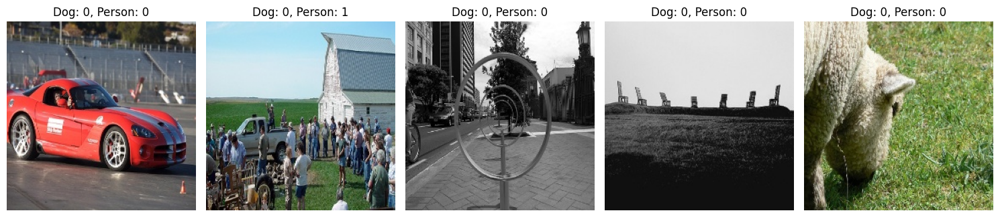

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Get a batch of images and labels
images, labels = next(validation_generator)

# Define the number of images to display
n = 5

plt.figure(figsize=(15, 15))
for i in range(n):
    ax = plt.subplot(1, n, i + 1)
    plt.imshow(images[i]/255)
    plt.title(f'Dog: {int(labels[i][0])}, Person: {int(labels[i][1])}')
    plt.axis("off")
plt.tight_layout()
plt.show()

validation_generator.reset()

### **Exercise 3**
Implement in Keras a simple CNN-based classifier that explores a pre-trained MobileNet
backbone, which musty be kept frozen when training the model, and a suitable classification
head with trainable weights.

In [ ]:
import tensorflow as tf
from tensorflow import keras
from keras.applications.mobilenet import MobileNet, preprocess_input
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout, Input, Flatten, Lambda
from tensorflow.keras.losses import BinaryCrossentropy

def create_model(optimizer):
  # Define input shape based on image generator and exercise documentation
  input_shape = (224, 224, 3)

  # Load pre-trained MobileNet without the top layers
  base_mobile_net_model = MobileNet(
      weights='imagenet',
      include_top=False,
      input_shape=input_shape
  )

  # Freeze the backbone
  base_mobile_net_model.trainable = False

  # Create classification head
  model = Sequential([
      Lambda(preprocess_input, input_shape=input_shape),
      base_mobile_net_model,
      GlobalAveragePooling2D(),
      Dense(32, activation='relu'),
      #Dropout(0.3),
      Dense(2, activation='sigmoid')
  ])

  # Compile the model
  model.compile(
      optimizer=optimizer,
      loss='binary_crossentropy',
      metrics=['accuracy', 'precision', 'recall']
  )

  # Print model parameters
  model.summary()

  return model

#### **Comparação entre pequenas modificações na arquitetura da rede**

Abaixo estão os resultados apresentados no treino de três variações do modelo com dados de teste e validação.

1. Modelo simples com apenas uma camada de duas saídas após a Mobile Net
2. Modelo com uma camada intermediária de 32 nós
3. Modelo com a camada intermediária seguida e uma conexão Dropout

Para os modelos com a camada intermediária foi notadas melhores métricas até as 20 primeiras épocas. Após as 20 primeiras épocas a loss em validação possuí um contínuo crescimento enquanto a loss em teste continua a diminuir. Porém vale notar que as métricas de acurácia, recall e precisão estabilizam.
A camada intermediária permitiu atingir resultados levemente melhores em validação ao mesmo tempo em que somente estas foram capazes de atingir scores máximos em teste.

**Nos próximos testes o modelo com a camada intermediária e sem Dropout será utilizado.**

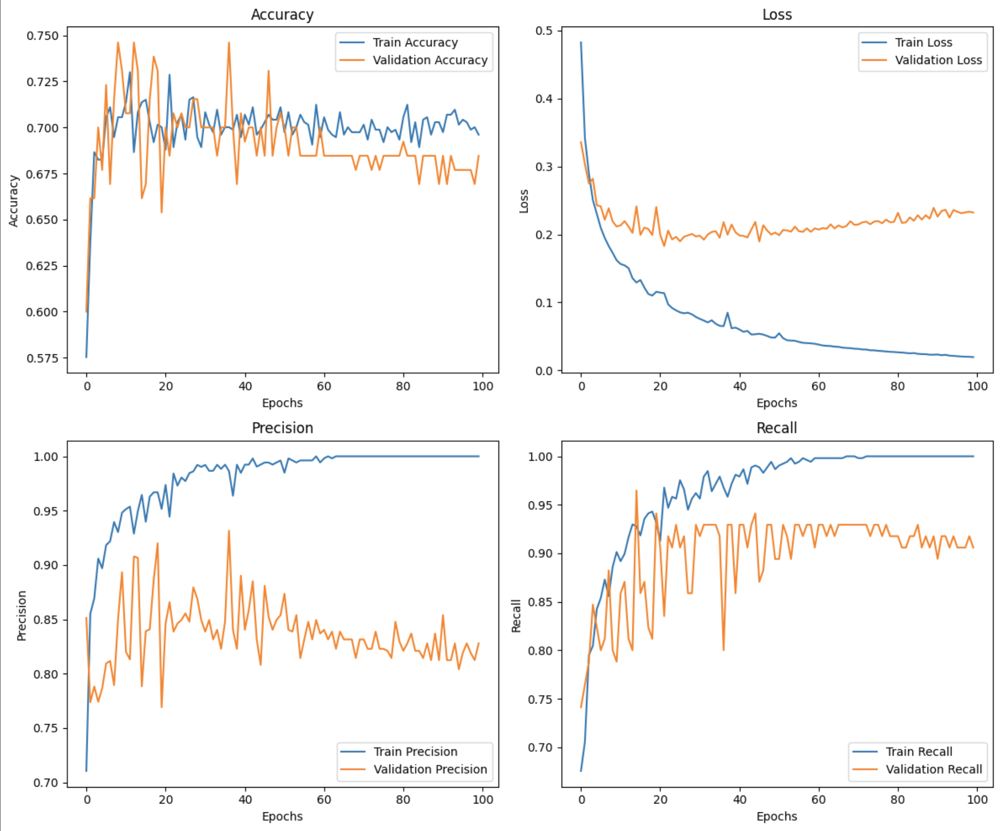

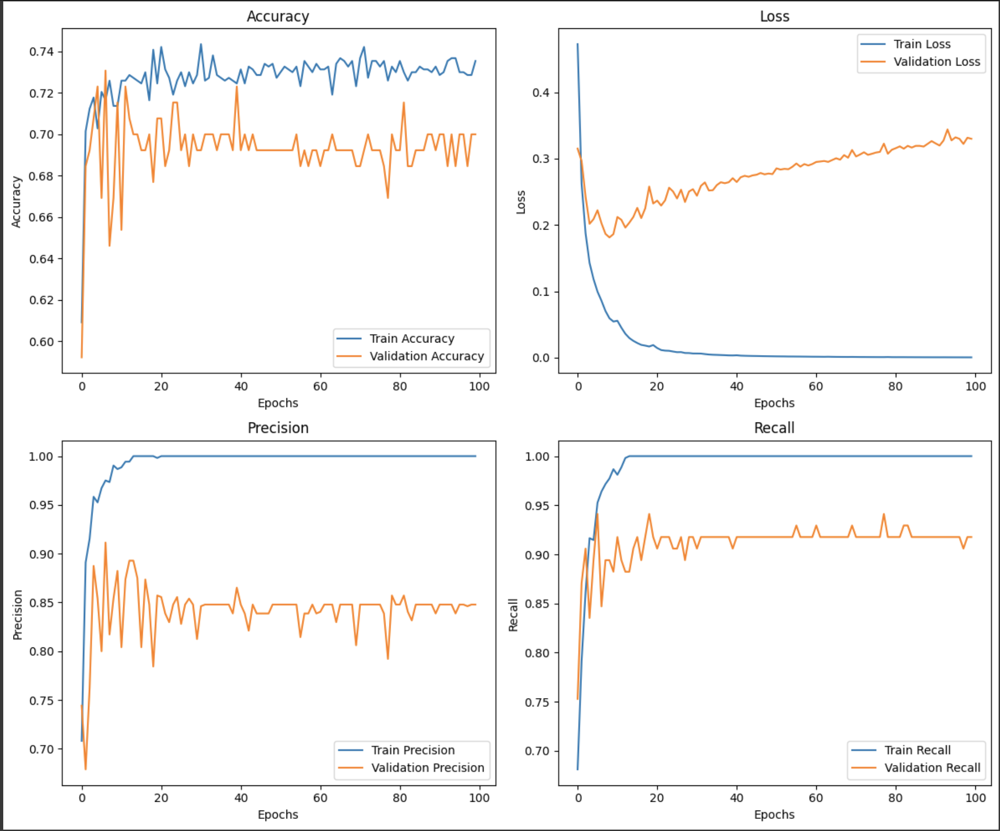

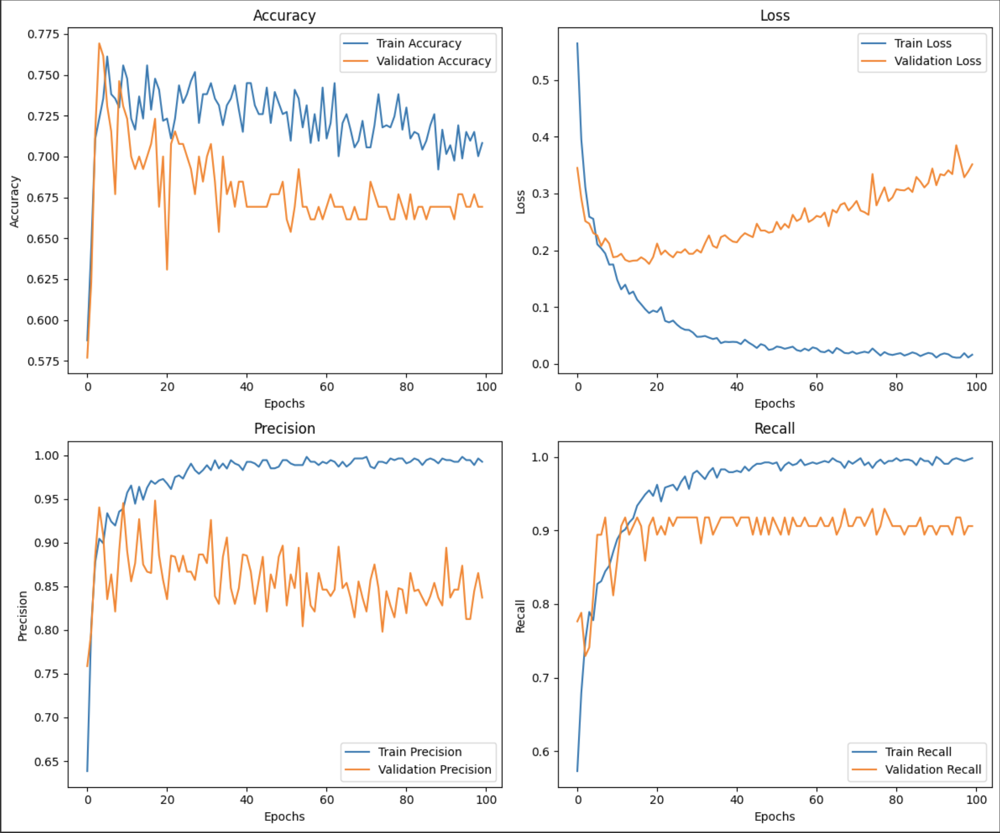

### **Exercise 4**
Choose a loss function, an optimizer, a learning rate and the number of epochs that
you think is the most appropriate for this task. If you think that overfitting is a problem,
think of mitigation strategies. Justify your choices experimentally or theoretically.

**Optimizers options**: Adam, AdamW, SGD, RMSprop

**Learning rate options**: 0.01, 0.001 and 0.0001



#### Define the models with different optimizers

In [ ]:
from tensorflow.keras.optimizers import Adam, AdamW, SGD, RMSprop

def create_model_with_adam(learning_rate=0.001):
  optimizer = Adam(learning_rate=learning_rate)
  return create_model(optimizer)

def create_model_with_adamw(learning_rate=0.001):
  optimizer = AdamW(learning_rate=learning_rate)
  return create_model(optimizer)

def create_model_with_sgd(learning_rate=0.001):
  optimizer = SGD(learning_rate=learning_rate)
  return create_model(optimizer)

def create_model_with_rms(learning_rate=0.001):
  optimizer = RMSprop(learning_rate=learning_rate)
  return create_model(optimizer)

#### Utility to plot the test and validation learning curves

In [ ]:
import numpy as np
import matplotlib.pyplot as plt


# Plot the training and validation loss and accuracy
def plot_training_history(history):
    # Extract metrics from history object
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    precision = history.history['precision']
    val_precision = history.history['val_precision']
    recall = history.history['recall']
    val_recall = history.history['val_recall']

    # Create subplots
    fig, axs = plt.subplots(2, 2, figsize=(12, 10))

    # Plot accuracy
    axs[0, 0].plot(acc, label='Train Accuracy')
    axs[0, 0].plot(val_acc, label='Validation Accuracy')
    axs[0, 0].set_title('Accuracy')
    axs[0, 0].set_xlabel('Epochs')
    axs[0, 0].set_ylabel('Accuracy')
    axs[0, 0].legend()

    # Plot loss
    axs[0, 1].plot(loss, label='Train Loss')
    axs[0, 1].plot(val_loss, label='Validation Loss')
    axs[0, 1].set_title('Loss')
    axs[0, 1].set_xlabel('Epochs')
    axs[0, 1].set_ylabel('Loss')
    axs[0, 1].legend()

    # Plot precision
    axs[1, 0].plot(precision, label='Train Precision')
    axs[1, 0].plot(val_precision, label='Validation Precision')
    axs[1, 0].set_title('Precision')
    axs[1, 0].set_xlabel('Epochs')
    axs[1, 0].set_ylabel('Precision')
    axs[1, 0].legend()

    # Plot recall
    axs[1, 1].plot(recall, label='Train Recall')
    axs[1, 1].plot(val_recall, label='Validation Recall')
    axs[1, 1].set_title('Recall')
    axs[1, 1].set_xlabel('Epochs')
    axs[1, 1].set_ylabel('Recall')
    axs[1, 1].legend()

    # Show the plots
    plt.tight_layout()
    plt.show()

#### Hyperparameters comparison

#####Optimizers comparison

###### **Result**

Entre os otimizadores testados abaixo, o ADAMW foi o modelo capaz de atingir uma acurácia e uma loss menor com uma menor quantidade de épocas.

Porém é importante ressaltar que dado um maior número de épocas o SGD conseguiu alcançar a mesma acurácia porém com uma loss menor, e após 300 épocas não demonstrou sinal de crescimento na loss de validação.

**Sendo assim utilizaremos o SGD como otimizador para os próximos experimentos.**

**Também seguiremos com 300 épocas dado que o modelo não apresentou pioras porém ainda possuímos a limitação de tempo de execução.**

###### Experiments

**ADAM**

Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lambda_7 (Lambda)               │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenet_1.00_224 (Functional) │ (None, 7, 7, 1024)     │     3,228,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_7      │ (None, 1024)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 32)             │        32,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 2)              │            66 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,261,730 (12.44 MB)

 Trainable params: 32,866 (128.38 KB)

 Non-trainable params: 3,228,864 (12.32 MB)

Epoch 1/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 14s 422ms/step - accuracy: 0.5311 - loss: 0.5630 - precision: 0.6054 - recall: 0.6396 - val_accuracy: 0.5538 - val_loss: 0.3482 - val_precision: 0.7526 - val_recall: 0.8588
Epoch 2/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 110ms/step - accuracy: 0.6162 - loss: 0.2801 - precision: 0.8335 - recall: 0.8100 - val_accuracy: 0.6846 - val_loss: 0.2882 - val_precision: 0.7732 - val_recall: 0.8824
Epoch 3/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - accuracy: 0.7071 - loss: 0.2109 - precision: 0.8987 - recall: 0.8769 - val_accuracy: 0.6692 - val_loss: 0.2336 - val_precision: 0.8701 - val_recall: 0.7882
Epoch 4/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 110ms/step - accuracy: 0.6685 - loss: 0.1643 - precision: 0.9546 - recall: 0.8616 - val_accuracy: 0.6923 - val_loss: 0.2410 - val_precision: 0.8085 - val_recall: 0.8941
Epoch 5/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 5s 88ms/step - accuracy: 0.7218 - loss: 0.1421 - precision: 0.9564 - recall: 0.9129 - val_accuracy: 0.6846 - val_los

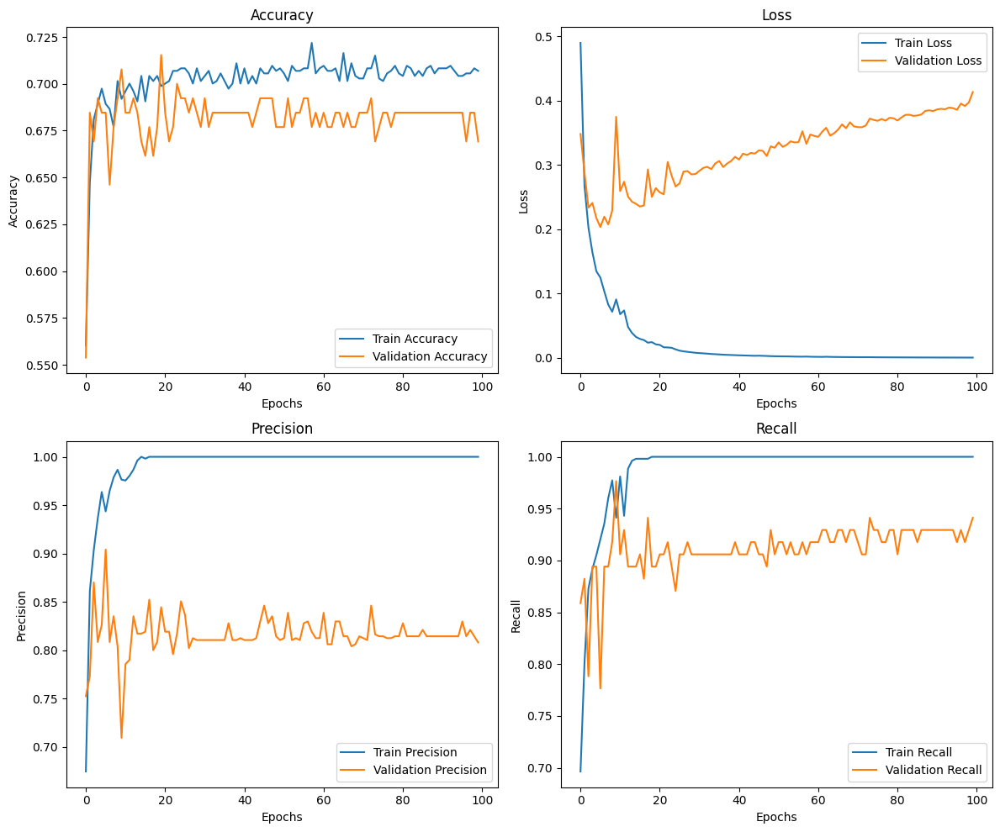

In [ ]:
number_of_epochs = 100

adam_model = create_model_with_adam()
history = adam_model.fit(
    train_generator,
    epochs=number_of_epochs,
    validation_data=validation_generator,
    verbose=1
)

plot_training_history(history)

**ADAMW**

Model: "sequential_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lambda_12 (Lambda)              │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenet_1.00_224 (Functional) │ (None, 7, 7, 1024)     │     3,228,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_12     │ (None, 1024)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 32)             │        32,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_23 (Dense)                │ (None, 2)              │            66 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,261,730 (12.44 MB)

 Trainable params: 32,866 (128.38 KB)

 Non-trainable params: 3,228,864 (12.32 MB)

Epoch 1/200
24/24 ━━━━━━━━━━━━━━━━━━━━ 11s 271ms/step - accuracy: 0.5832 - loss: 0.5805 - precision: 0.5919 - recall: 0.6559 - val_accuracy: 0.6615 - val_loss: 0.3419 - val_precision: 0.8906 - val_recall: 0.6706
Epoch 2/200
24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 63ms/step - accuracy: 0.6673 - loss: 0.3365 - precision: 0.8870 - recall: 0.6512 - val_accuracy: 0.6077 - val_loss: 0.3289 - val_precision: 0.6887 - val_recall: 0.8588
Epoch 3/200
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - accuracy: 0.6973 - loss: 0.2592 - precision: 0.8829 - recall: 0.7953 - val_accuracy: 0.7077 - val_loss: 0.2269 - val_precision: 0.9041 - val_recall: 0.7765
Epoch 4/200
24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - accuracy: 0.7524 - loss: 0.2100 - precision: 0.9403 - recall: 0.8150 - val_accuracy: 0.7154 - val_loss: 0.2292 - val_precision: 0.8889 - val_recall: 0.7529
Epoch 5/200
24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - accuracy: 0.7427 - loss: 0.1605 - precision: 0.9458 - recall: 0.8752 - val_accuracy: 0.6923 - val_loss: 

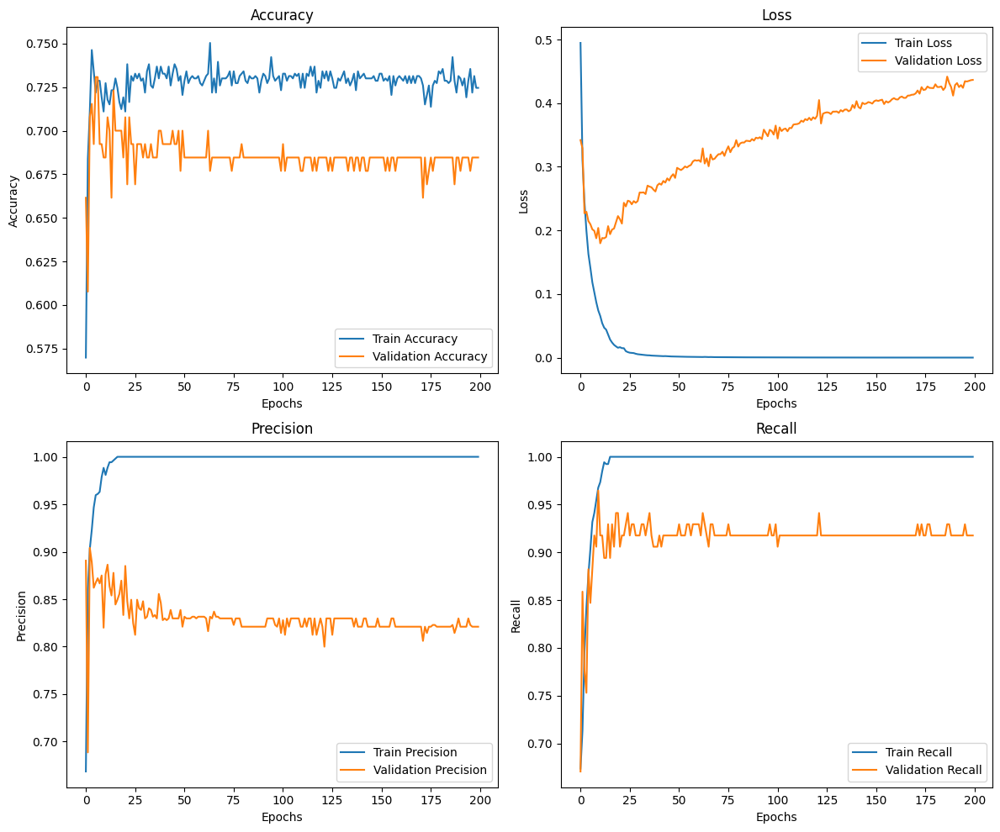

In [ ]:
number_of_epochs = 200

adamw_model = create_model_with_adamw()
history = adamw_model.fit(
    train_generator,
    epochs=number_of_epochs,
    validation_data=validation_generator,
    verbose=1
)

plot_training_history(history)

**SGD**

Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lambda_11 (Lambda)              │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenet_1.00_224 (Functional) │ (None, 7, 7, 1024)     │     3,228,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_11     │ (None, 1024)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_20 (Dense)                │ (None, 32)             │        32,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_21 (Dense)                │ (None, 2)              │            66 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,261,730 (12.44 MB)

 Trainable params: 32,866 (128.38 KB)

 Non-trainable params: 3,228,864 (12.32 MB)

Epoch 1/300
24/24 ━━━━━━━━━━━━━━━━━━━━ 10s 263ms/step - accuracy: 0.5209 - loss: 0.7911 - precision: 0.4229 - recall: 0.8536 - val_accuracy: 0.5154 - val_loss: 0.6356 - val_precision: 0.5141 - val_recall: 0.8588
Epoch 2/300
24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - accuracy: 0.5403 - loss: 0.6499 - precision: 0.5111 - recall: 0.7363 - val_accuracy: 0.5385 - val_loss: 0.5669 - val_precision: 0.5280 - val_recall: 0.7765
Epoch 3/300
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - accuracy: 0.5514 - loss: 0.6034 - precision: 0.5597 - recall: 0.6880 - val_accuracy: 0.5462 - val_loss: 0.5356 - val_precision: 0.5727 - val_recall: 0.7412
Epoch 4/300
24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - accuracy: 0.5335 - loss: 0.5842 - precision: 0.5591 - recall: 0.6669 - val_accuracy: 0.5462 - val_loss: 0.5195 - val_precision: 0.5755 - val_recall: 0.7176
Epoch 5/300
24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step - accuracy: 0.5663 - loss: 0.5384 - precision: 0.5985 - recall: 0.6988 - val_accuracy: 0.5462 - val_loss: 

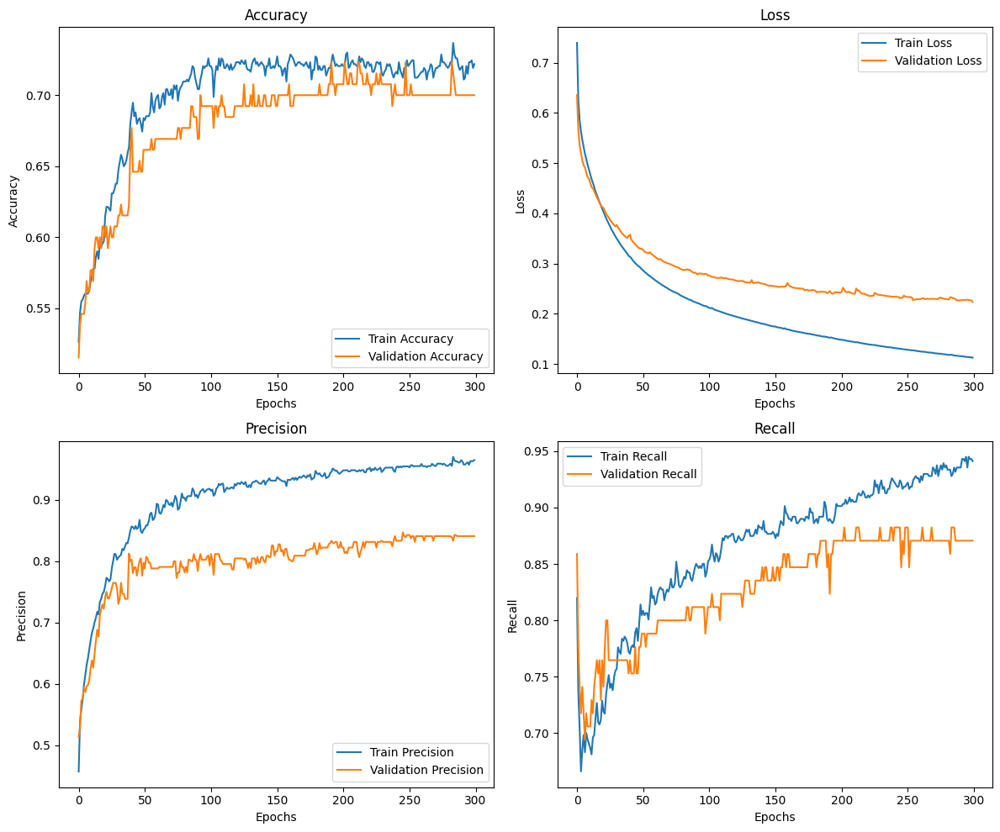

In [ ]:
number_of_epochs = 300

sgd_model = create_model_with_sgd()
history = sgd_model.fit(
    train_generator,
    epochs=number_of_epochs,
    validation_data=validation_generator,
    verbose=1
)

plot_training_history(history)

**RMS**

Model: "sequential_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lambda_10 (Lambda)              │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenet_1.00_224 (Functional) │ (None, 7, 7, 1024)     │     3,228,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_10     │ (None, 1024)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 32)             │        32,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 2)              │            66 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,261,730 (12.44 MB)

 Trainable params: 32,866 (128.38 KB)

 Non-trainable params: 3,228,864 (12.32 MB)

Epoch 1/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 11s 275ms/step - accuracy: 0.5841 - loss: 0.5471 - precision: 0.6301 - recall: 0.7101 - val_accuracy: 0.7385 - val_loss: 0.3726 - val_precision: 0.9773 - val_recall: 0.5059
Epoch 2/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step - accuracy: 0.7034 - loss: 0.2847 - precision: 0.8857 - recall: 0.7581 - val_accuracy: 0.5846 - val_loss: 0.3566 - val_precision: 0.6471 - val_recall: 0.9059
Epoch 3/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step - accuracy: 0.6932 - loss: 0.2394 - precision: 0.8694 - recall: 0.8458 - val_accuracy: 0.6692 - val_loss: 0.2144 - val_precision: 0.8409 - val_recall: 0.8706
Epoch 4/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 81ms/step - accuracy: 0.7267 - loss: 0.1617 - precision: 0.9370 - recall: 0.8953 - val_accuracy: 0.7231 - val_loss: 0.2131 - val_precision: 0.8961 - val_recall: 0.8118
Epoch 5/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - accuracy: 0.7468 - loss: 0.1529 - precision: 0.9262 - recall: 0.9005 - val_accuracy: 0.7308 - val_loss: 

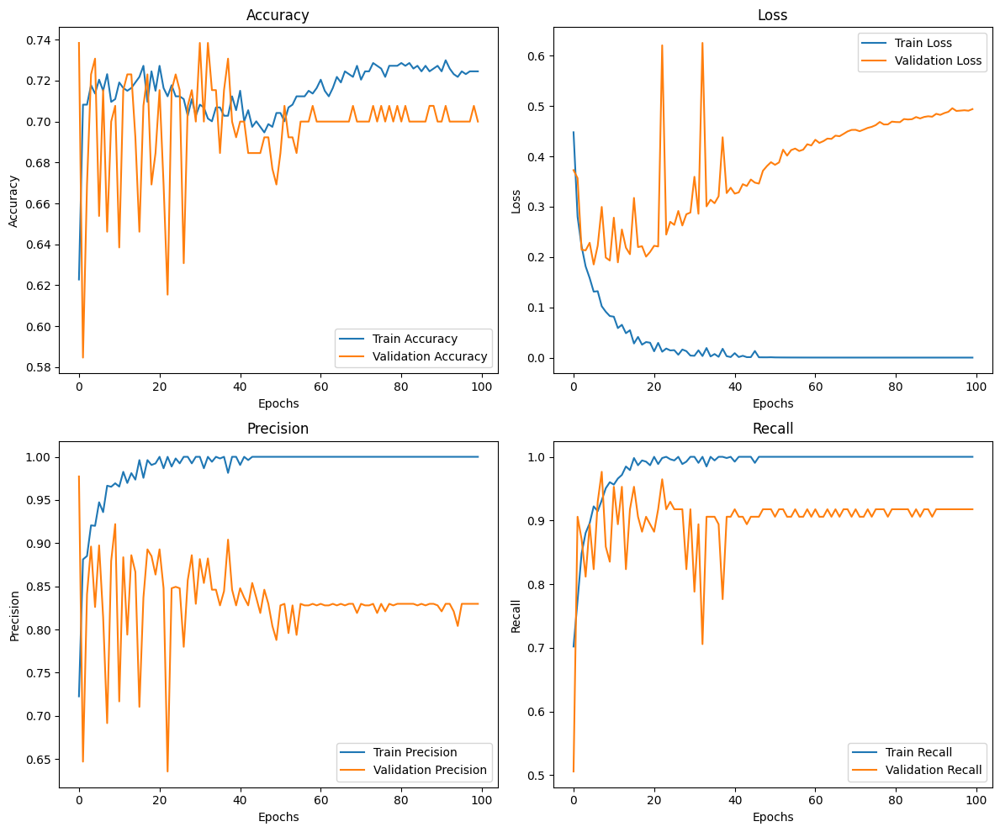

In [ ]:
number_of_epochs = 100

rms_model = create_model_with_rms()
history = rms_model.fit(
    train_generator,
    epochs=number_of_epochs,
    validation_data=validation_generator,
    verbose=1
)

plot_training_history(history)

##### Learning rate comparison

###### Result

Utilizando uma loss de 0.1 tivemos um resultado similar a outros otimizadores análisados anteriormente, uma curva de aprendizado mais rápida porém um continuo crescimento da loss de validação após a estabilização de outras métricas.

Com uma loss de 0.01 a loss de validação permaneceu em redução por um número maior de épocas, alcançando um mínimo um pouco menor. Porém após determinado tempo ela demonstrou um grande crescimento.

Com uma loss de 0.001 e 300 épocas não foi possível atingir um valor mínimo, sendo que ao final do treinamento ela continua a reduzir.

Vale ressaltar que o menor valor de loss em validação foi obtido ao utilizar o learning rate de 0.1 na época 5. O mesmo também alcançou a melhor acurácia em sua 12 época de treinamento. **Porém, no geral, a learning rate de 0.001 possuí os resultados mais estáveis, mantendo valores contantes tanto de loss quanto de acurácia.** Uma hipótese provavével é que a learning rate maior faz tanto o modelo encontrar um mínimo local melhor mais rápido quanto perder o mesmo, e talvez com um número de época maiores o modelo com menor learning rate possa apresentar comportamente similar.

**Dada a maior estabilidade nas próximas etapas será utilizado o learning rate de 0.001**

###### Experiments

**0.1**

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/lambda_layer.py:65: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lambda_13 (Lambda)              │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenet_1.00_224 (Functional) │ (None, 7, 7, 1024)     │     3,228,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_13     │ (None, 1024)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_24 (Dense)                │ (None, 32)             │        32,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_25 (Dense)                │ (None, 2)              │            66 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,261,730 (12.44 MB)

 Trainable params: 32,866 (128.38 KB)

 Non-trainable params: 3,228,864 (12.32 MB)

Epoch 1/300
24/24 ━━━━━━━━━━━━━━━━━━━━ 10s 230ms/step - accuracy: 0.5304 - loss: 0.6662 - precision: 0.5912 - recall: 0.5885 - val_accuracy: 0.5769 - val_loss: 0.3429 - val_precision: 0.6667 - val_recall: 0.8706
Epoch 2/300
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step - accuracy: 0.6602 - loss: 0.3131 - precision: 0.8178 - recall: 0.7700 - val_accuracy: 0.7077 - val_loss: 0.2607 - val_precision: 0.8571 - val_recall: 0.7765
Epoch 3/300
24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step - accuracy: 0.7196 - loss: 0.2004 - precision: 0.9249 - recall: 0.8520 - val_accuracy: 0.6154 - val_loss: 0.3632 - val_precision: 0.6290 - val_recall: 0.9176
Epoch 4/300
24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 94ms/step - accuracy: 0.7164 - loss: 0.1996 - precision: 0.8912 - recall: 0.7958 - val_accuracy: 0.7000 - val_loss: 0.2692 - val_precision: 0.7297 - val_recall: 0.9529
Epoch 5/300
24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step - accuracy: 0.7312 - loss: 0.1702 - precision: 0.9537 - recall: 0.8828 - val_accuracy: 0.7077 - val_loss: 

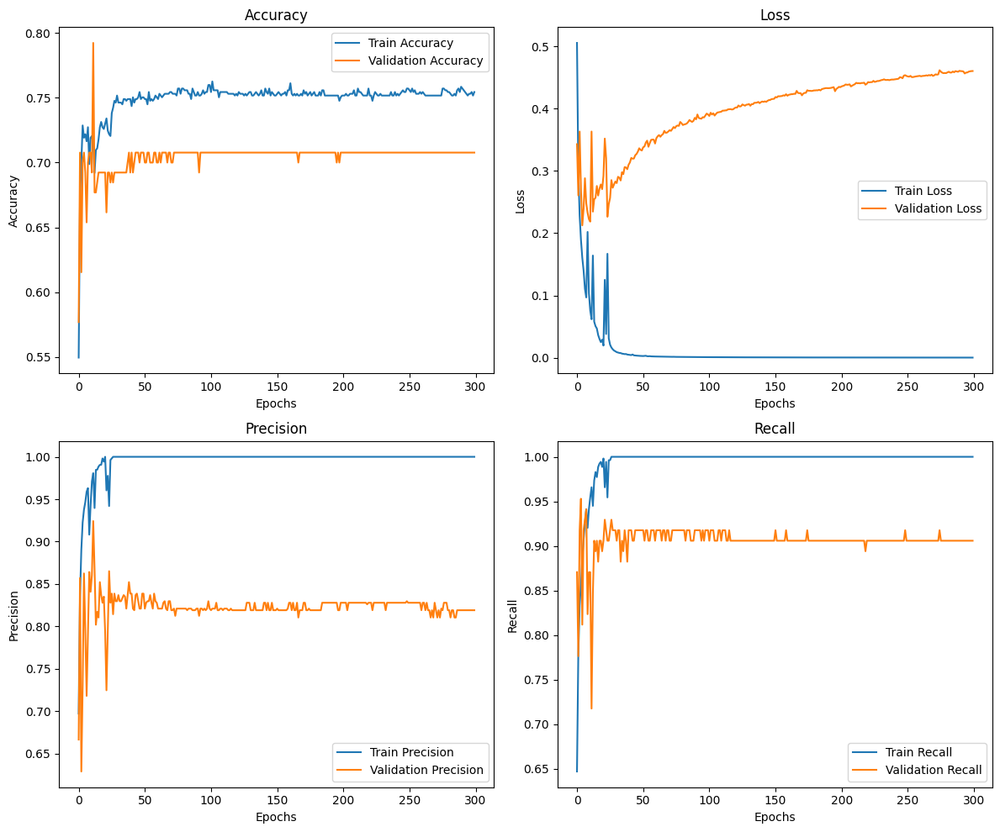

In [ ]:
number_of_epochs = 300

sgd_model = create_model_with_sgd(learning_rate=0.1)
history = sgd_model.fit(
    train_generator,
    epochs=number_of_epochs,
    validation_data=validation_generator,
    verbose=1
)

plot_training_history(history)

**0.01**

Model: "sequential_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lambda_14 (Lambda)              │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenet_1.00_224 (Functional) │ (None, 7, 7, 1024)     │     3,228,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_14     │ (None, 1024)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_26 (Dense)                │ (None, 32)             │        32,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_27 (Dense)                │ (None, 2)              │            66 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,261,730 (12.44 MB)

 Trainable params: 32,866 (128.38 KB)

 Non-trainable params: 3,228,864 (12.32 MB)

Epoch 1/300
24/24 ━━━━━━━━━━━━━━━━━━━━ 11s 271ms/step - accuracy: 0.5465 - loss: 0.8794 - precision: 0.4057 - recall: 0.5664 - val_accuracy: 0.5538 - val_loss: 0.4994 - val_precision: 0.6250 - val_recall: 0.7647
Epoch 2/300
24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - accuracy: 0.5785 - loss: 0.5074 - precision: 0.6641 - recall: 0.6561 - val_accuracy: 0.6000 - val_loss: 0.4360 - val_precision: 0.7143 - val_recall: 0.7059
Epoch 3/300
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - accuracy: 0.5874 - loss: 0.4591 - precision: 0.7253 - recall: 0.6684 - val_accuracy: 0.6154 - val_loss: 0.3990 - val_precision: 0.7381 - val_recall: 0.7294
Epoch 4/300
24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step - accuracy: 0.6541 - loss: 0.3894 - precision: 0.7964 - recall: 0.7335 - val_accuracy: 0.6077 - val_loss: 0.3731 - val_precision: 0.7273 - val_recall: 0.7529
Epoch 5/300
24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - accuracy: 0.6577 - loss: 0.3484 - precision: 0.8431 - recall: 0.7255 - val_accuracy: 0.6923 - val_loss: 

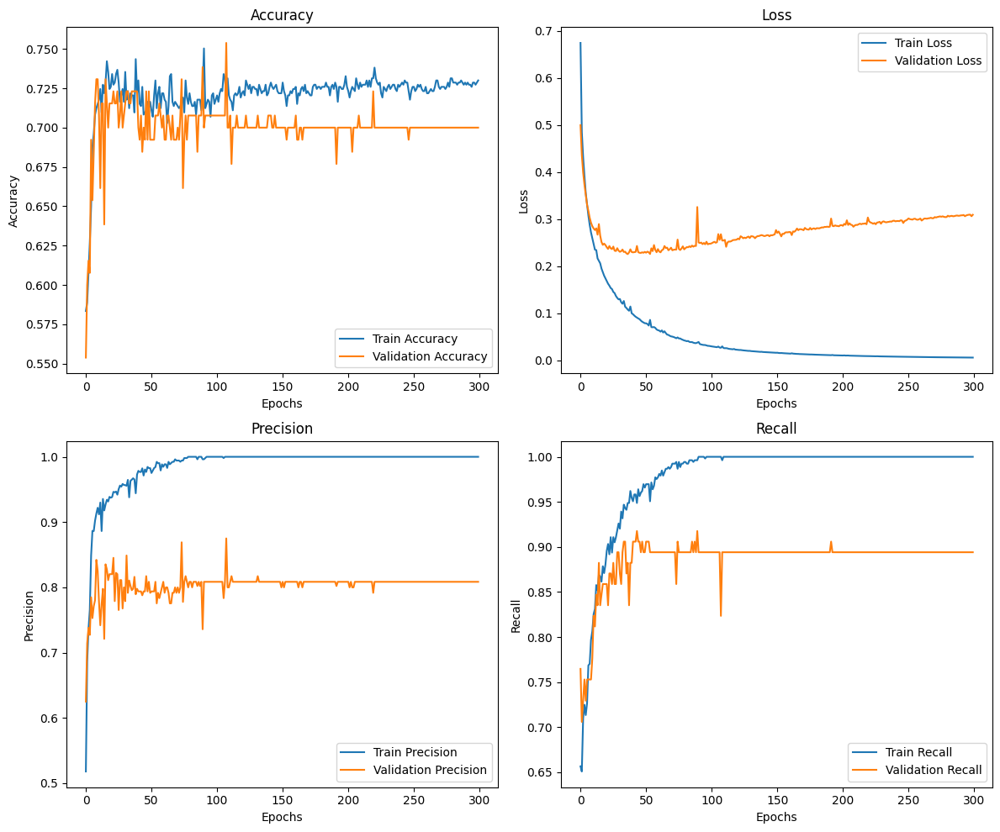

In [ ]:
number_of_epochs = 300

sgd_model = create_model_with_sgd(learning_rate=0.01)
history = sgd_model.fit(
    train_generator,
    epochs=number_of_epochs,
    validation_data=validation_generator,
    verbose=1
)

plot_training_history(history)

**0.001**

Model: "sequential_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lambda_15 (Lambda)              │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenet_1.00_224 (Functional) │ (None, 7, 7, 1024)     │     3,228,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_15     │ (None, 1024)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_28 (Dense)                │ (None, 32)             │        32,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_29 (Dense)                │ (None, 2)              │            66 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,261,730 (12.44 MB)

 Trainable params: 32,866 (128.38 KB)

 Non-trainable params: 3,228,864 (12.32 MB)

Epoch 1/300
24/24 ━━━━━━━━━━━━━━━━━━━━ 10s 254ms/step - accuracy: 0.4987 - loss: 1.1041 - precision: 0.1561 - recall: 0.1762 - val_accuracy: 0.4769 - val_loss: 0.7876 - val_precision: 0.2658 - val_recall: 0.2471
Epoch 2/300
24/24 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.5590 - loss: 0.6921 - precision: 0.4883 - recall: 0.3550 - val_accuracy: 0.4923 - val_loss: 0.6468 - val_precision: 0.4615 - val_recall: 0.3529
Epoch 3/300
24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.6006 - loss: 0.5942 - precision: 0.5656 - recall: 0.4269 - val_accuracy: 0.5615 - val_loss: 0.5905 - val_precision: 0.5128 - val_recall: 0.4706
Epoch 4/300
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - accuracy: 0.5537 - loss: 0.5619 - precision: 0.6330 - recall: 0.4951 - val_accuracy: 0.5692 - val_loss: 0.5626 - val_precision: 0.5443 - val_recall: 0.5059
Epoch 5/300
24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.5880 - loss: 0.5320 - precision: 0.6847 - recall: 0.6071 - val_accuracy: 0.5846 - val_loss: 

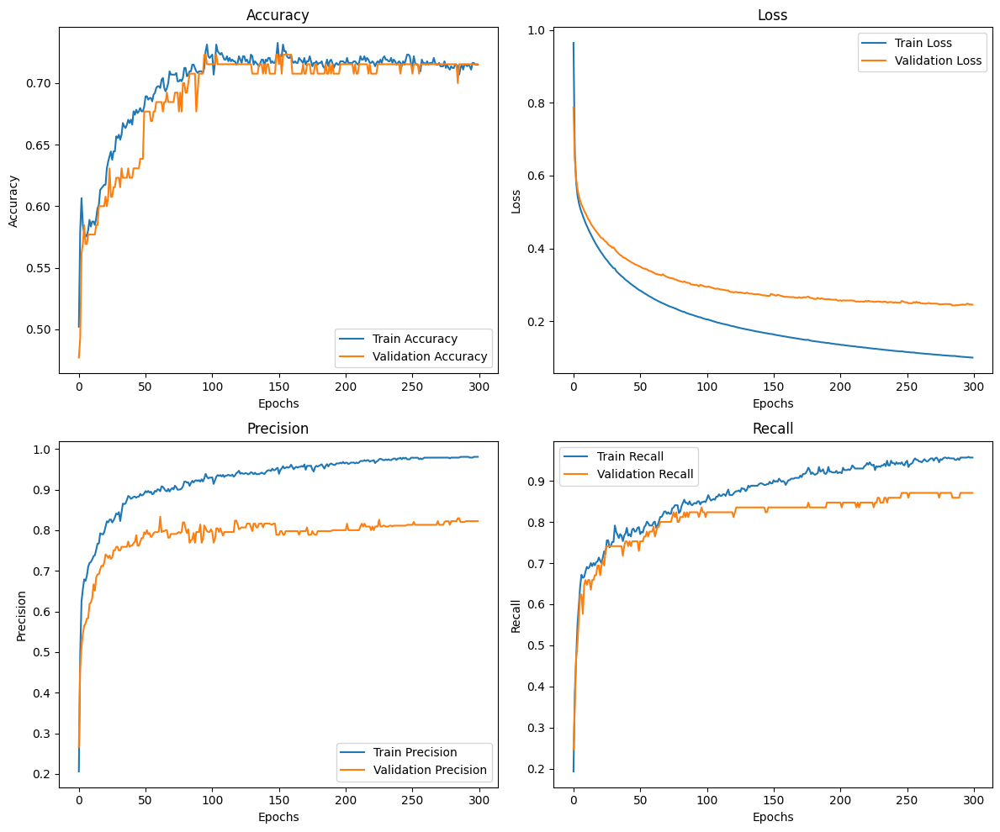

In [ ]:
number_of_epochs = 300

sgd_model = create_model_with_sgd(learning_rate=0.001)
history = sgd_model.fit(
    train_generator,
    epochs=number_of_epochs,
    validation_data=validation_generator,
    verbose=1
)

plot_training_history(history)

### **Exercise 5**
Evaluate your model quantitatively by computing the per-category precision and recall rates
also qualitatively, by showing some visual examples of classi
cation results (good and bad).

In [ ]:
import numpy as np
from sklearn.metrics import classification_report

def calculate_evaluation_metrics(model):
  test_generator.reset()
  x_batches, y_true_batches = [], []

  for i in range(len(test_generator)):
      x, y = test_generator[i]
      x_batches.append(x)
      y_true_batches.append(y)

  X_test = np.concatenate(x_batches)
  y_true = np.concatenate(y_true_batches)

  y_probs = model.predict(X_test)
  y_pred = (y_probs > 0.5).astype(int)

  class_names = ['dog', 'person']

  print(classification_report(y_true, y_pred, target_names=class_names))

In [ ]:
import random

def print_misclassified_samples_from_test(model, shuffle=False):
  test_generator.reset()
  x_batches = []
  y_true_batches = []
  for i in range(len(test_generator)):
      x_batch, y_batch = test_generator[i]
      x_batches.append(x_batch)
      y_true_batches.append(y_batch)

  X = np.concatenate(x_batches, axis=0)
  Y_true = np.concatenate(y_true_batches, axis=0)

  Y_pred_raw = model.predict(X, batch_size=test_generator.batch_size)
  Y_pred = (Y_pred_raw > 0.5).astype(int)

  mis_idx = np.where((Y_pred != Y_true).any(axis=1))[0]

  if shuffle:
    random.shuffle(mis_idx)

  class_names = ['dog','person']

  n_show = min(6, len(mis_idx))
  plt.figure(figsize=(n_show*3, 3))
  for i, idx in enumerate(mis_idx[:n_show]):
      ax = plt.subplot(1, n_show, i+1)
      img = X[idx]
      ax.imshow(img/255)
      true_lbls = [class_names[j] for j,v in enumerate(Y_true[idx]) if v]
      pred_lbls = [class_names[j] for j,v in enumerate(Y_pred[idx]) if v]
      ax.set_title(f"True labels: {true_lbls}\nPredicted labels: {pred_lbls}")
      ax.axis('off')
  plt.tight_layout()
  plt.show()
  plt.close()

In [ ]:
import random
import numpy as np
import matplotlib.pyplot as plt


def print_successfully_classified_samples_from_test(model, shuffle=False):
    test_generator.reset()
    x_batches = []
    y_true_batches = []
    for i in range(len(test_generator)):
        x_batch, y_batch = test_generator[i]
        x_batches.append(x_batch)
        y_true_batches.append(y_batch)

    X = np.concatenate(x_batches, axis=0)
    Y_true = np.concatenate(y_true_batches, axis=0)

    Y_pred_raw = model.predict(X, batch_size=test_generator.batch_size)
    Y_pred = (Y_pred_raw > 0.5).astype(int)

    mis_idx = np.where(np.all((Y_pred == Y_true), axis=1))[0]

    if shuffle:
      random.shuffle(mis_idx)

    class_names = ['dog','person']

    n_show = min(6, len(mis_idx))
    plt.figure(figsize=(n_show*3, 3))
    for i, idx in enumerate(mis_idx[:n_show]):
        ax = plt.subplot(1, n_show, i+1)
        img = X[idx]
        ax.imshow(img/255)
        true_lbls = [class_names[j] for j,v in enumerate(Y_true[idx]) if v]
        pred_lbls = [class_names[j] for j,v in enumerate(Y_pred[idx]) if v]
        ax.set_title(f"True labels: {true_lbls}\nPredicted labels: {pred_lbls}")
        ax.axis('off')
    plt.tight_layout()
    plt.show()
    plt.close()

17225924/17225924 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/lambda_layer.py:65: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lambda (Lambda)                 │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenet_1.00_224 (Functional) │ (None, 7, 7, 1024)     │     3,228,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1024)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 32)             │        32,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 2)              │            66 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,261,730 (12.44 MB)

 Trainable params: 32,866 (128.38 KB)

 Non-trainable params: 3,228,864 (12.32 MB)

Epoch 1/300


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


24/24 ━━━━━━━━━━━━━━━━━━━━ 13s 280ms/step - accuracy: 0.4421 - loss: 0.8001 - precision: 0.2484 - recall: 0.0639 - val_accuracy: 0.6231 - val_loss: 0.6156 - val_precision: 0.5484 - val_recall: 0.2000
Epoch 2/300
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step - accuracy: 0.5461 - loss: 0.6586 - precision: 0.4095 - recall: 0.1751 - val_accuracy: 0.5692 - val_loss: 0.5406 - val_precision: 0.6250 - val_recall: 0.4118
Epoch 3/300
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step - accuracy: 0.5782 - loss: 0.5728 - precision: 0.6063 - recall: 0.4156 - val_accuracy: 0.5846 - val_loss: 0.5025 - val_precision: 0.6389 - val_recall: 0.5412
Epoch 4/300
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - accuracy: 0.5824 - loss: 0.5552 - precision: 0.6548 - recall: 0.5015 - val_accuracy: 0.5769 - val_loss: 0.4818 - val_precision: 0.6410 - val_recall: 0.5882
Epoch 5/300
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - accuracy: 0.5581 - loss: 0.5281 - precision: 0.6591 - recall: 0.5754 - val_accuracy: 0.5769 - val_loss: 0.4656 - val

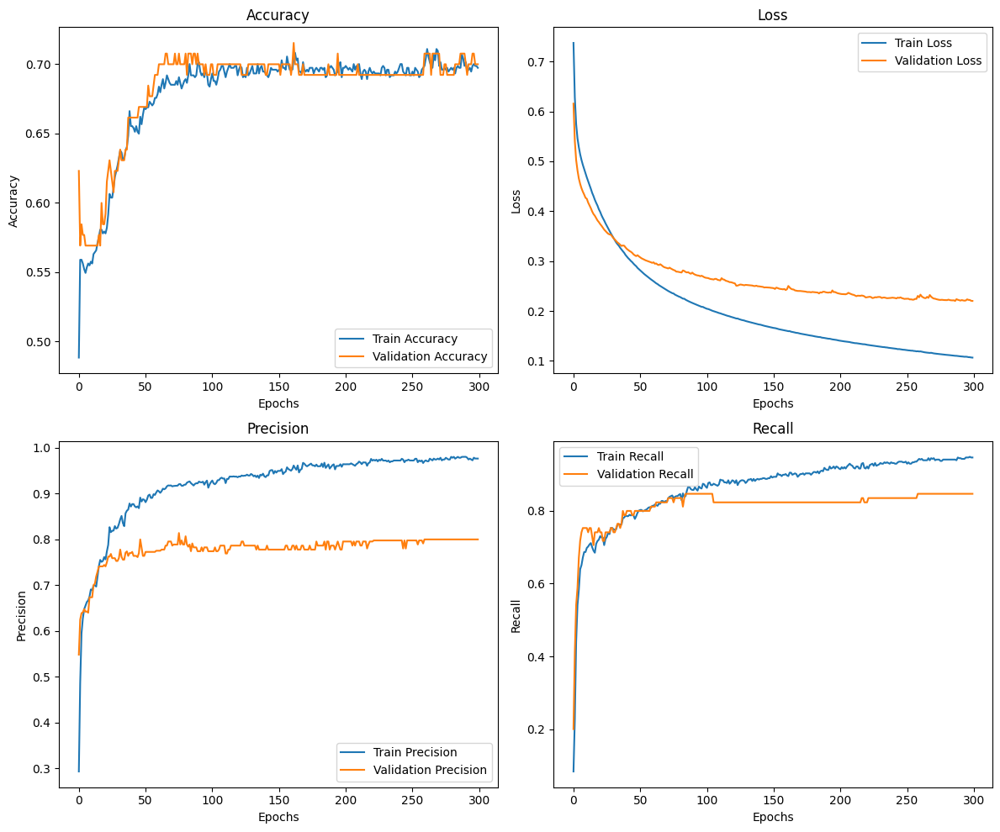

In [ ]:
number_of_epochs = 300

final_model = create_model_with_sgd(learning_rate=0.001)
history = final_model.fit(
    train_generator,
    epochs=number_of_epochs,
    validation_data=validation_generator,
    verbose=1
)

plot_training_history(history)

Executando o código abaixo múltiplos erros podem ser encontrados, como:
- Imagens com carros e pessoas dentro que a rede não consegue classificar
- Imagens com carros que a rede constantemente prediz como tendo pessoas, o que faz sentido contextual

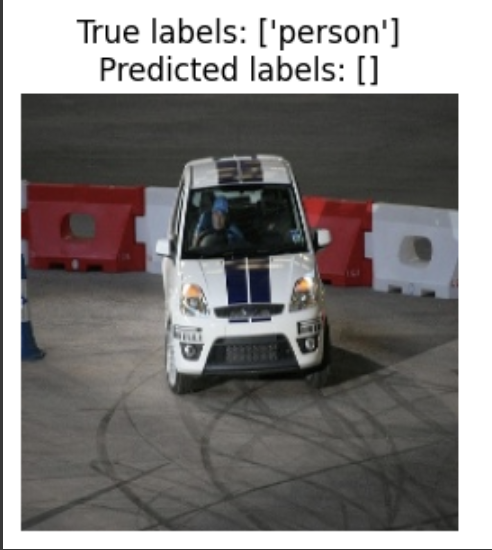

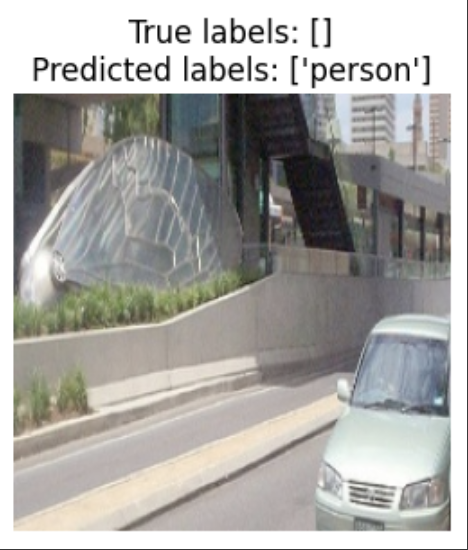

Em algumas imagens até para humanos é difícil realizar a correta classificação devido a qualidade da imagem e a iluminação da cena.

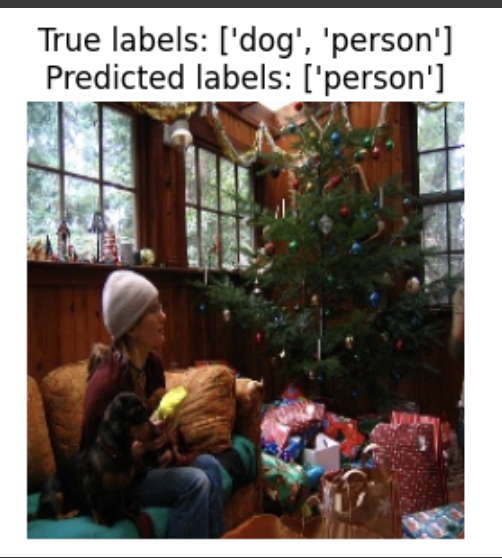

Outros examplo de imagem difícil de classificar:

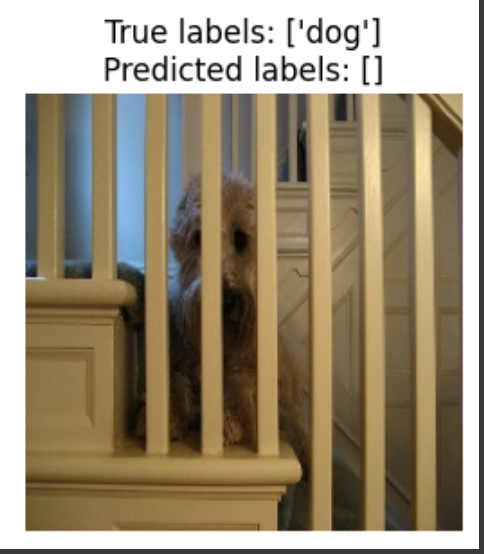

Imagens de aparente fácil classificação também foram preditas incorretamente:

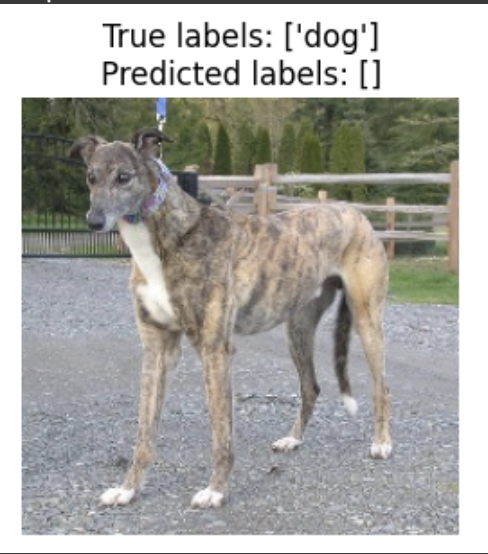

11/11 ━━━━━━━━━━━━━━━━━━━━ 4s 278ms/step


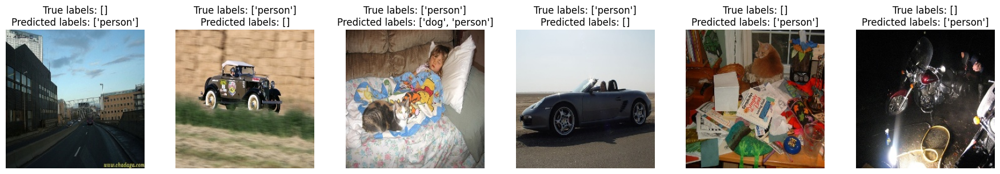

In [ ]:
# Execute o código múltiplas vezes
print_misclassified_samples_from_test(final_model, shuffle=True)

O modelo foi capaz de detectar pessoas e cachorros principalmente em imagens as quais eles eram o centro da fotografia:

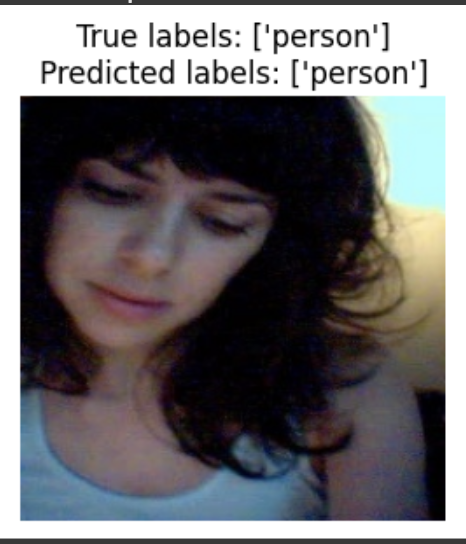

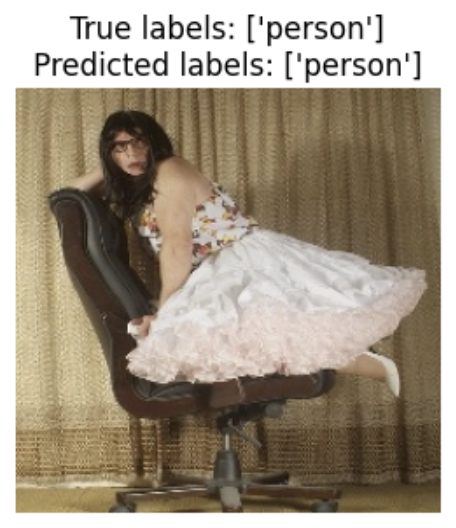

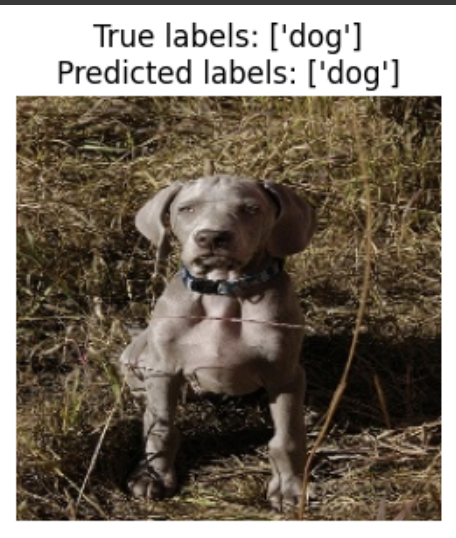

Praticamente todos os acertos identificaram apenas uma das classes presentes na imagem

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


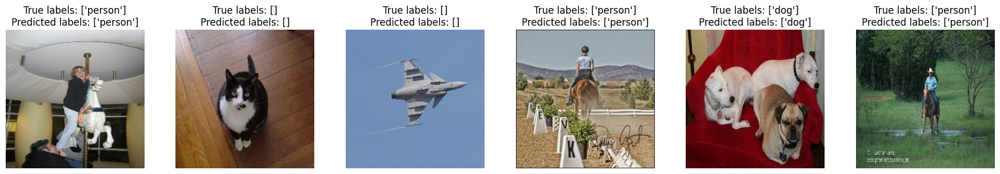

In [ ]:
# Execute o código múltiplas vezes
print_successfully_classified_samples_from_test(final_model, shuffle=True)

Ao final a precisão, o recall e o F1 score foram melhores para a classe 'pessoa', provavelmente devido ao fato desta classe estar mais bem representada no dataset.

Apesar dos valores individuais de predição 'descentes', o modelo não se provou suficientemente capaz de detectar ambas nas classes na mesma imagem.

Uma análise detalhada do dataset pode ser conduzida para entender melhor a distruição das classes que pode ser uma das causadores das diferenças observadas.

In [ ]:
calculate_evaluation_metrics(final_model)

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
              precision    recall  f1-score   support

         dog       0.82      0.72      0.77        43
      person       0.92      0.87      0.89       187

   micro avg       0.90      0.84      0.87       230
   macro avg       0.87      0.80      0.83       230
weighted avg       0.90      0.84      0.87       230
 samples avg       0.57      0.57      0.57       230



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in samples with no true nor predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
